In [230]:
import numpy as np
import pandas as pd
import missingno as misno
from autoviz.AutoViz_Class import AutoViz_Class
import matplotlib.pyplot as plt
import sweetviz as sv
from sklearn.impute import SimpleImputer
import sweetviz as sv
from catboost import CatBoostClassifier
import catboost
from sklearn.model_selection import train_test_split, GridSearchCV
import category_encoders as ce
from imblearn.combine import SMOTETomek
import sklearn.metrics as skm
import joblib

**Importing the code and performing EDA**

In [4]:
df = pd.read_csv(r"C:\Users\Dell\Desktop\ML course\Income_Inequality_Prediction_Project2\Dataset\Inequality Prediction Dataset.csv")
df_copy = df.copy()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 43 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              209499 non-null  object 
 1   age                             209499 non-null  int64  
 2   gender                          209499 non-null  object 
 3   education                       209499 non-null  object 
 4   class                           104254 non-null  object 
 5   education_institute             13302 non-null   object 
 6   marital_status                  209499 non-null  object 
 7   race                            209499 non-null  object 
 8   is_hispanic                     209499 non-null  object 
 9   employment_commitment           209499 non-null  object 
 10  unemployment_reason             6520 non-null    object 
 11  employment_stat                 209499 non-null  int64  
 12  wage_per_hour   

**Columns have less than 25% of non null values, similar or ID type would be removed**

*Remove education_institute as it has many null values and is a repeat of education*

*Remove unemployment_reason*

*Remove is_labor_union,veterans_questionnaire,migration_prev_sunbelt,residence_1_year, old_residence_reg, _state*

*Based on employment_commitment, half of them are unemployed*

*Columns AK and AL are almost the same, removing AK*



In [6]:
df.shape

(209499, 43)

In [7]:
# Inlcludes all data types except int and float
df.describe(include=['O']).T

,count,unique,top,freq
ID,209499,209499,ID_TZ86846,1
gender,209499,2,Female,108784
education,209499,17,High school graduate,50627
class,104254,8,Private,75617
education_institute,13302,2,High school,7247
marital_status,209499,7,Never married,90723
race,209499,5,White,175709
is_hispanic,209499,10,All other,180404
employment_commitment,209499,8,Children or Armed Forces,129789
unemployment_reason,6520,5,Other job loser,2242


**Check for duplicates, missing and unknown values**

In [8]:
df = df.drop(columns = ['old_residence_reg','old_residence_state','is_labor_union', 'veterans_admin_questionnaire','unemployment_reason','is_labor_union','education_institute','under_18_family','migration_prev_sunbelt','residence_1_year_ago','migration_code_move_within_reg','ID'])

In [9]:
df.shape

(209499, 32)

In [10]:
df = df.replace(' ?',np.NaN)

In [11]:
df.describe(include = 'O')

,gender,education,class,marital_status,race,is_hispanic,employment_commitment,industry_code_main,occupation_code_main,household_stat,household_summary,tax_status,citizenship,country_of_birth_own,country_of_birth_father,country_of_birth_mother,migration_code_change_in_msa,migration_code_change_in_reg,income_above_limit
count,209499,209499,104254,209499,209499,209499,209499,209499,103805,209499,209499,209499,209499,205832,202318,202983,103215,103215,209499
unique,2,17,8,7,5,10,8,24,14,38,8,6,5,42,42,42,8,7,2
top,Female,High school graduate,Private,Never married,White,All other,Children or Armed Forces,Not in universe or children,Adm support including clerical,Householder,Householder,Nonfiler,Native,US,US,US,unchanged,unchanged,Below limit
freq,108784,50627,75617,90723,175709,180404,129789,105694,15351,56195,79470,78671,185669,185666,166968,168233,86864,86864,196501


<AxesSubplot:>

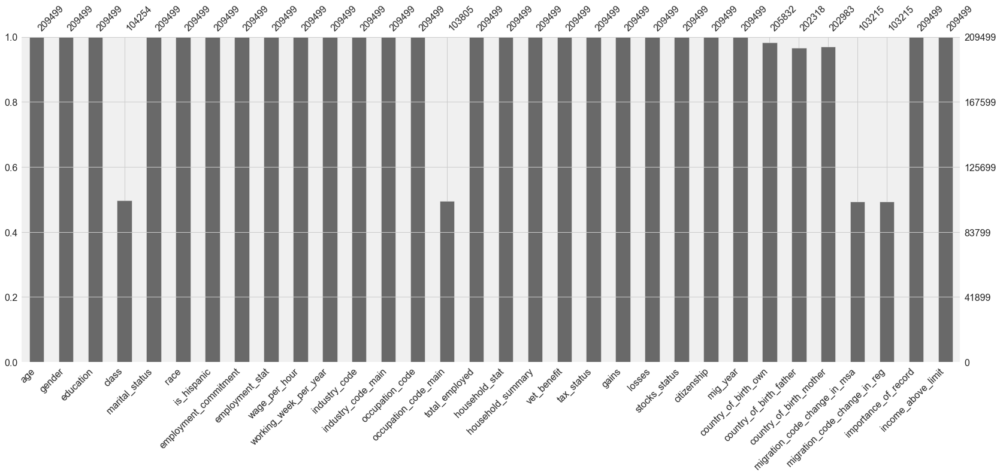

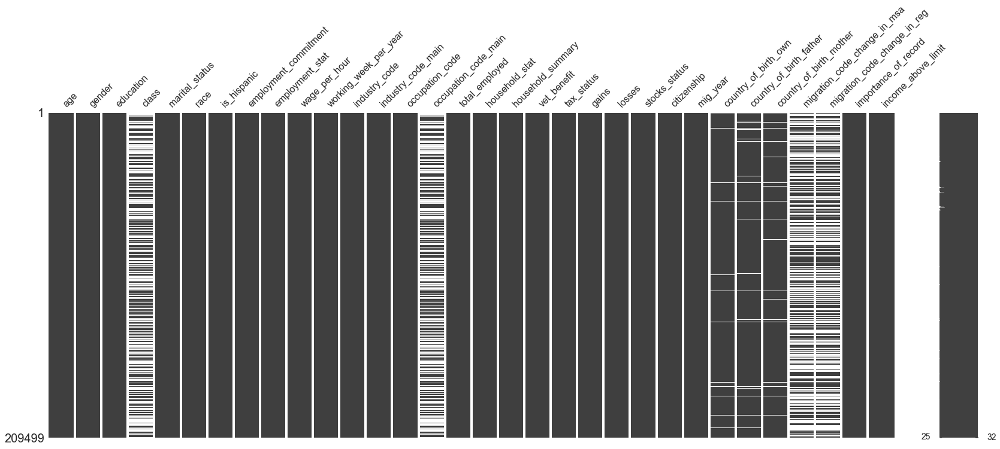

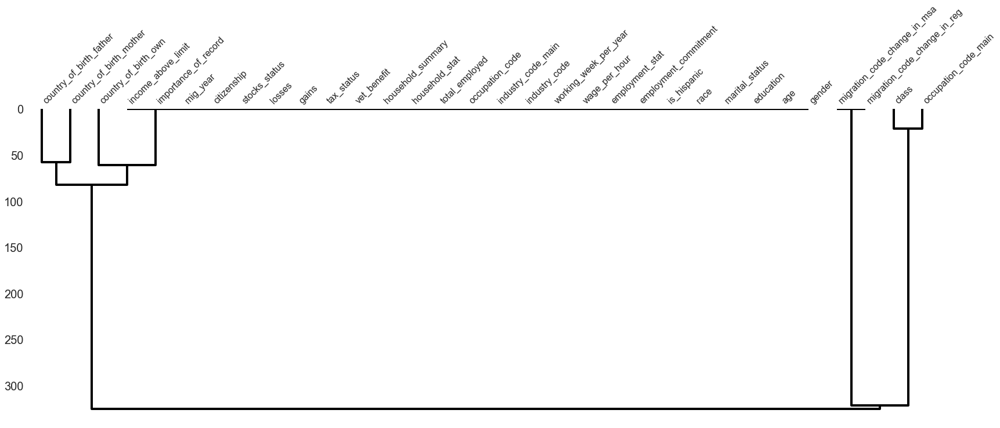

In [13]:
%matplotlib inline
misno.bar(df)
misno.matrix(df)
misno.dendrogram(df)

In [35]:
# pd.DataFrame(impute.fit_transform(df)) will make you lose the column labels and dtypes, hence mention them back explicitly
# cant use dtype paramater in DataFrame as it convert to only one dtype
impute = SimpleImputer(strategy = 'most_frequent')
df = pd.DataFrame(impute.fit_transform(df), columns = df.columns).astype(df.dtypes.to_dict())

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209499 entries, 0 to 209498
Data columns (total 32 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   age                           209499 non-null  int64  
 1   gender                        209499 non-null  object 
 2   education                     209499 non-null  object 
 3   class                         209499 non-null  object 
 4   marital_status                209499 non-null  object 
 5   race                          209499 non-null  object 
 6   is_hispanic                   209499 non-null  object 
 7   employment_commitment         209499 non-null  object 
 8   employment_stat               209499 non-null  int64  
 9   wage_per_hour                 209499 non-null  int64  
 10  working_week_per_year         209499 non-null  int64  
 11  industry_code                 209499 non-null  int64  
 12  industry_code_main            209499 non-nul

In [37]:
# Removing duplicated rows
duplicate_rows = df.duplicated()
duplicated_index = df[df.duplicated() == True].index
df = df.drop(index = duplicated_index)
df.duplicated().sum()

0

In [38]:
df

,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,...,stocks_status,citizenship,mig_year,country_of_birth_own,country_of_birth_father,country_of_birth_mother,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit
0,79,Female,High school graduate,Private,Widowed,White,All other,Not in labor force,0,0,...,292,Native,95,US,US,US,unchanged,unchanged,1779.74,Below limit
1,65,Female,High school graduate,Private,Widowed,White,All other,Children or Armed Forces,0,0,...,0,Native,94,US,US,US,unchanged,unchanged,2366.75,Below limit
2,21,Male,12th grade no diploma,Federal government,Never married,Black,All other,Children or Armed Forces,0,500,...,0,Native,94,US,US,US,unchanged,unchanged,1693.42,Below limit
3,2,Female,Children,Private,Never married,Asian or Pacific Islander,All other,Children or Armed Forces,0,0,...,0,Native,94,US,India,India,unchanged,unchanged,1380.27,Below limit
4,70,Male,High school graduate,Private,Married-civilian spouse present,White,All other,Not in labor force,0,0,...,0,Native,95,US,US,US,unchanged,unchanged,1580.79,Below limit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209494,16,Female,7th and 8th grade,Private,Never married,White,All other,Not in labor force,0,0,...,0,Native,95,US,US,US,unchanged,unchanged,2170.60,Below limit
209495,78,Male,Bachelors degree(BA AB BS),Private,Married-civilian spouse present,White,All other,Not in labor force,0,0,...,71,Native,95,US,US,Canada,unchanged,unchanged,1029.57,Below limit
209496,8,Female,Children,Private,Never married,White,All other,Children or Armed Forces,0,0,...,0,Native,95,US,US,US,unchanged,unchanged,791.61,Below limit
209497,26,Female,Some college but no degree,Private,Married-civilian spouse present,White,All other,Children or Armed Forces,0,700,...,0,Native,94,US,US,US,unchanged,unchanged,3530.26,Below limit


In [48]:
av = AutoViz_Class()

In [289]:
%matplotlib inline

Shape of your Data Set loaded: (149997, 28)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    27 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification VISUALIZATION Started #####################


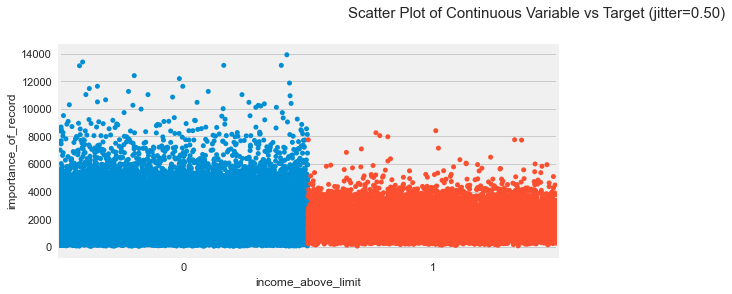

Could not draw Distribution Plots


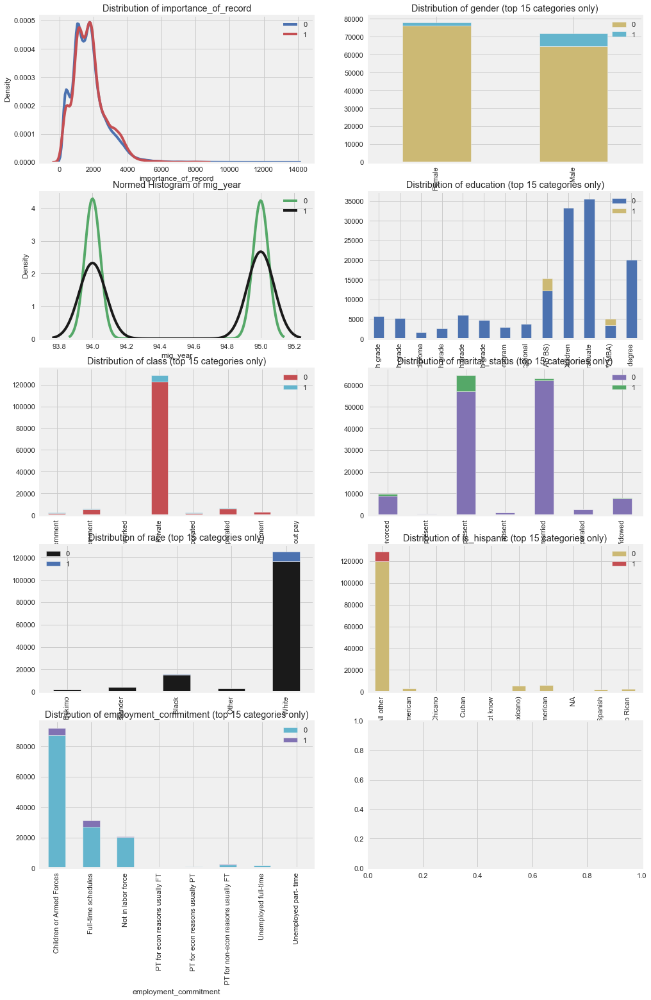

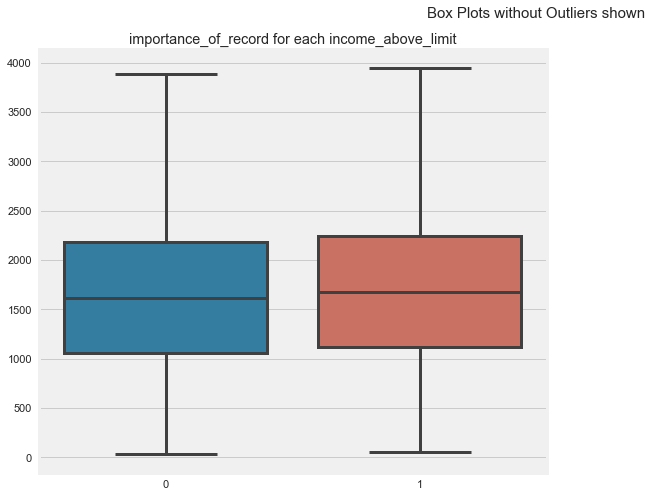

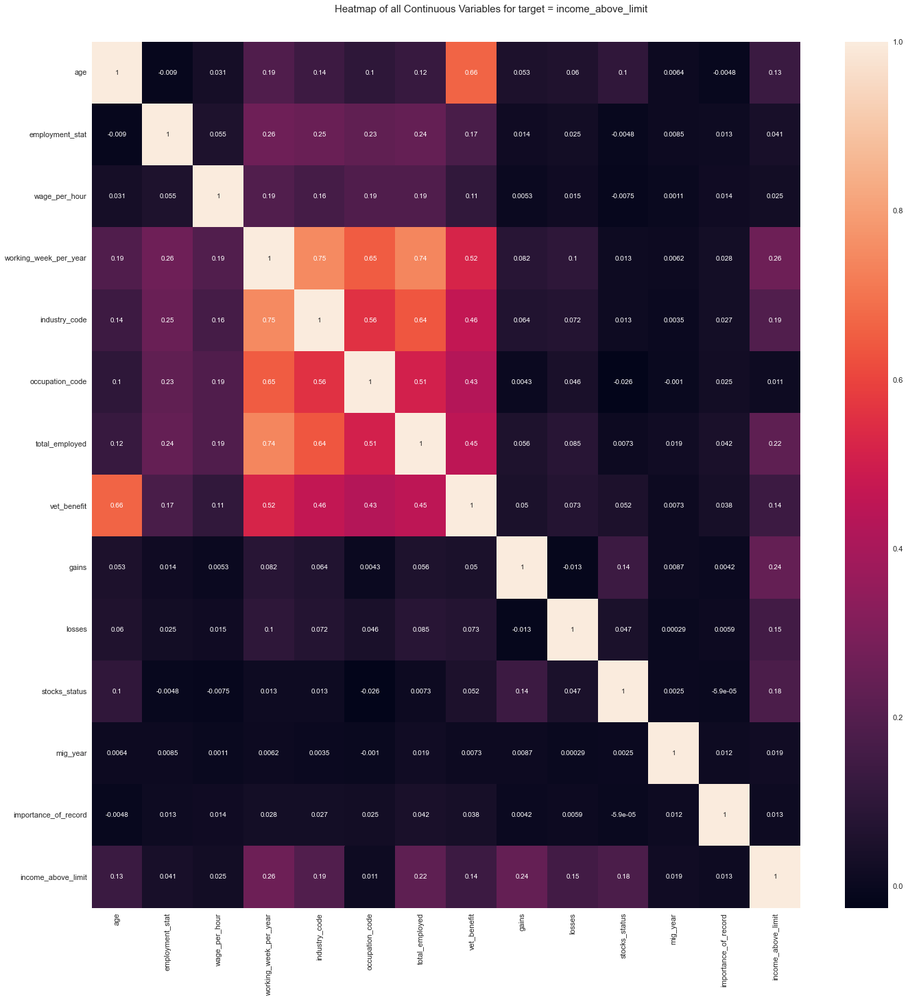

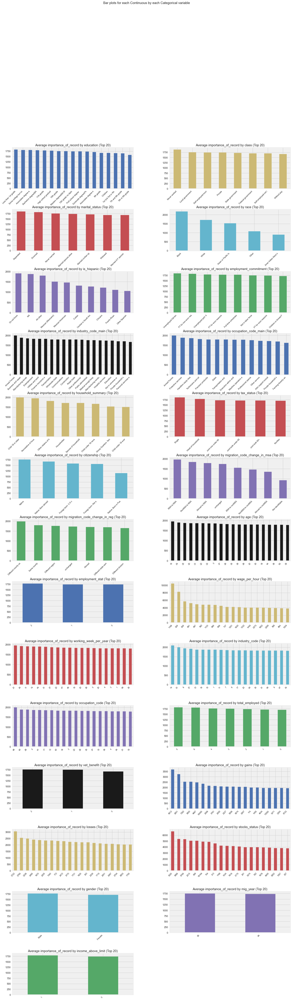

Time to run AutoViz (in seconds) = 171

 ###################### VISUALIZATION Completed ########################


In [61]:
df = av.AutoViz(filename = "",depVar = 'income_above_limit', dfte = df)

In [21]:
fixdq = FixDQ()

In [28]:
data_cleansing_suggestions(df)
fixdq.detect_duplicates(df)

Alert: Detecting 4545 duplicate rows...


,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,working_week_per_year,industry_code,industry_code_main,occupation_code,occupation_code_main,total_employed,household_stat,household_summary,vet_benefit,tax_status,gains,losses,stocks_status,citizenship,mig_year,country_of_birth_own,country_of_birth_father,country_of_birth_mother,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit
0,79,Female,High school graduate,NaN,Widowed,White,All other,Not in labor force,0,0,52,0,Not in universe or children,0,NaN,2,Householder,Householder,2,Head of household,0,0,292,Native,95,US,US,US,?,?,1779.74,Below limit
1,65,Female,High school graduate,NaN,Widowed,White,All other,Children or Armed Forces,0,0,0,0,Not in universe or children,0,NaN,0,Nonfamily householder,Householder,2,Single,0,0,0,Native,94,US,US,US,unchanged,unchanged,2366.75,Below limit
2,21,Male,12th grade no diploma,Federal government,Never married,Black,All other,Children or Armed Forces,0,500,15,41,Hospital services,26,Adm support including clerical,4,Child 18+ never marr Not in a subfamily,Child 18 or older,2,Single,0,0,0,Native,94,US,US,US,unchanged,unchanged,1693.42,Below limit
3,2,Female,Children,NaN,Never married,Asian or Pacific Islander,All other,Children or Armed Forces,0,0,0,0,Not in universe or children,0,NaN,0,Child <18 never marr not in subfamily,Child under 18 never married,0,Nonfiler,0,0,0,Native,94,US,India,India,unchanged,unchanged,1380.27,Below limit
4,70,Male,High school graduate,NaN,Married-civilian spouse present,White,All other,Not in labor force,0,0,0,0,Not in universe or children,0,NaN,0,Spouse of householder,Spouse of householder,2,Joint both 65+,0,0,0,Native,95,US,US,US,?,?,1580.79,Below limit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
209494,16,Female,7th and 8th grade,NaN,Never married,White,All other,Not in labor force,0,0,0,0,Not in universe or children,0,NaN,0,Child <18 never marr not in subfamily,Child under 18 never married,2,Nonfiler,0,0,0,Native,95,US,US,US,?,?,2170.60,Below limit
209495,78,Male,Bachelors degree(BA AB BS),NaN,Married-civilian spouse present,White,All other,Not in labor force,0,0,0,0,Not in universe or children,0,NaN,0,Householder,Householder,2,Joint both 65+,0,0,71,Native,95,US,US,Canada,?,?,1029.57,Below limit
209496,8,Female,Children,NaN,Never married,White,All other,Children or Armed Forces,0,0,0,0,Not in universe or children,0,NaN,0,Child <18 never marr not in subfamily,Child under 18 never married,0,Nonfiler,0,0,0,Native,95,US,US,US,?,?,791.61,Below limit
209497,26,Female,Some college but no degree,Private,Married-civilian spouse present,White,All other,Children or Armed Forces,0,700,52,32,Wholesale trade,42,Handlers equip cleaners etc,4,Spouse of householder,Spouse of householder,2,Joint both under 65,0,0,0,Native,94,US,US,US,unchanged,unchanged,3530.26,Below limit


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150000 entries, 2490 to 165650
Data columns (total 28 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   age                           150000 non-null  int64  
 1   gender                        150000 non-null  object 
 2   education                     150000 non-null  object 
 3   class                         150000 non-null  object 
 4   marital_status                150000 non-null  object 
 5   race                          150000 non-null  object 
 6   is_hispanic                   150000 non-null  object 
 7   employment_commitment         150000 non-null  object 
 8   employment_stat               150000 non-null  int64  
 9   wage_per_hour                 150000 non-null  int64  
 10  working_week_per_year         150000 non-null  int64  
 11  industry_code                 150000 non-null  int64  
 12  industry_code_main            150000 non-

In [ ]:
Observations occuring frequently:
	1. Working in private sector
	2. Married and having a living partner, probably greater financial burden
	3. Whites or natives, hence non-Hispanics
	4. Employment statistical level is 0
	5. Administrative jobs
	6. Getting veterans benefits, links to where employment was committed for Armed Forces
	7. Migrated in 1994-1995
    8. Migration code remains unchanged in MSA or reg
    9. Importance of record is above 4000
Target variable

In [50]:
data_cleaning_suggestions(df)

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,int64,0.000000,0,0.000000,90.000000,No issue
gender,object,0.000000,0,,,No issue
education,object,0.000000,0,,,"4 rare categories: [' 1st 2nd 3rd or 4th grade', ' Prof school degree (MD DDS DVM LLB JD)', ' Doctorate degree(PhD EdD)', ' Less than 1st grade']. Group them into a single category or drop the categories."
class,object,49.142734,0,,,"100720 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: [' Never worked', ' Without pay']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: float, object,"
marital_status,object,0.000000,0,,,"2 rare categories: [' Married-spouse absent', ' Married-A F spouse present']. Group them into a single category or drop the categories."
race,object,0.000000,0,,,No issue
is_hispanic,object,0.000000,0,,,"4 rare categories: [' Cuban', ' NA', ' Chicano', ' Do not know']. Group them into a single category or drop the categories."
employment_commitment,object,0.000000,0,,,"3 rare categories: [' PT for econ reasons usually PT', ' Unemployed part- time', ' PT for econ reasons usually FT']. Group them into a single category or drop the categories."
employment_stat,int64,0.000000,0,0.000000,2.000000,Column has 19941 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
wage_per_hour,int64,0.000000,0,0.000000,9999.000000,Column has 11854 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
age,int64,0.000000,0,0.0,90.0,No issue
gender,object,0.000000,0,,,No issue
education,object,0.000000,0,,,"4 rare categories: [' 1st 2nd 3rd or 4th grade', ' Prof school degree (MD DDS DVM LLB JD)', ' Doctorate degree(PhD EdD)', ' Less than 1st grade']. Group them into a single category or drop the categories."
class,object,49.142734,0,,,"100720 missing values. Impute them with mean, median, mode, or a constant value such as 123., 2 rare categories: [' Never worked', ' Without pay']. Group them into a single category or drop the categories., Mixed dtypes: has 2 different data types: float, object,"
marital_status,object,0.000000,0,,,"2 rare categories: [' Married-spouse absent', ' Married-A F spouse present']. Group them into a single category or drop the categories."
race,object,0.000000,0,,,No issue
is_hispanic,object,0.000000,0,,,"4 rare categories: [' Cuban', ' NA', ' Chicano', ' Do not know']. Group them into a single category or drop the categories."
employment_commitment,object,0.000000,0,,,"3 rare categories: [' PT for econ reasons usually PT', ' Unemployed part- time', ' PT for econ reasons usually FT']. Group them into a single category or drop the categories."
employment_stat,int64,0.000000,0,0.0,2.0,Column has 19941 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
wage_per_hour,int64,0.000000,0,0.0,9999.0,Column has 11854 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.


,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,...,tax_status,gains,losses,stocks_status,citizenship,mig_year,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit


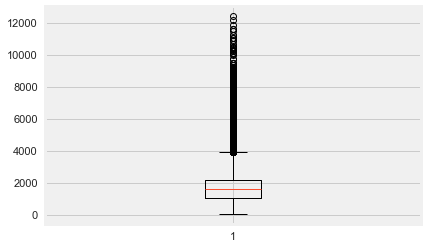

In [67]:
# Remove outliers
plt.boxplot(df['importance_of_record'])
df[df['importance_of_record']>13000]
#df = df.drop(index = [166457,193518,36721,163001,59847,194012,203766,170960])

In [68]:
df.shape

(149992, 28)

In [132]:
# Encode before using SMOTETomek, load the values into a dictionary in case you want to refer to values
encoder = ce.OrdinalEncoder()
df.shape

(149649, 28)

In [133]:
df = encoder.fit_transform(df)

In [134]:
df_copy

,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,...,tax_status,gains,losses,stocks_status,citizenship,mig_year,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit
2490,7,Male,Children,Private,Never married,Black,All other,Children or Armed Forces,0,0,...,Nonfiler,0,0,0,Native,94,unchanged,unchanged,2415.32,0
42050,16,Male,11th grade,Private,Never married,White,All other,Not in labor force,0,0,...,Nonfiler,0,0,0,Native,95,unchanged,unchanged,1814.95,0
158263,60,Female,Some college but no degree,Self-employed-incorporated,Married-civilian spouse present,White,All other,PT for non-econ reasons usually FT,0,0,...,Joint one under 65 & one 65+,0,0,0,Native,95,unchanged,unchanged,1498.37,0
48126,20,Male,Some college but no degree,Private,Never married,Asian or Pacific Islander,All other,Full-time schedules,2,680,...,Single,0,0,0,Foreign born- Not a citizen of U S,95,unchanged,unchanged,3130.05,0
142672,1,Female,Children,Private,Never married,White,All other,Children or Armed Forces,0,0,...,Nonfiler,0,0,0,Native,94,unchanged,unchanged,2167.91,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204292,57,Female,Some college but no degree,Private,Married-civilian spouse present,White,All other,Children or Armed Forces,0,1150,...,Joint both under 65,0,0,0,Native,94,unchanged,unchanged,1410.56,0
55505,33,Female,Some college but no degree,Private,Married-civilian spouse present,White,All other,Children or Armed Forces,0,0,...,Joint both under 65,0,0,0,Native,94,unchanged,unchanged,3717.73,0
25169,33,Male,High school graduate,Private,Married-civilian spouse present,Black,All other,Children or Armed Forces,0,0,...,Joint both under 65,0,0,0,Native,94,unchanged,unchanged,1452.73,0
145357,29,Female,High school graduate,Private,Married-civilian spouse present,White,Central or South American,Children or Armed Forces,0,0,...,Joint both under 65,0,0,0,Foreign born- Not a citizen of U S,94,unchanged,unchanged,697.40,0


In [292]:
array1 = df_copy['gender'].unique()
array2 = df_test['gender'].unique()
gender_dict = {array2[i]:array1[i] for i in range(2)}
print (gender_dict)
len(array1)

{1: ' Male', 2: ' Female'}


2

In [286]:
df_copy

,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,...,tax_status,gains,losses,stocks_status,citizenship,mig_year,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit
2490,7,Male,Children,Private,Never married,Black,All other,Children or Armed Forces,0,0,...,Nonfiler,0,0,0,Native,94,unchanged,unchanged,2415.32,0
42050,16,Male,11th grade,Private,Never married,White,All other,Not in labor force,0,0,...,Nonfiler,0,0,0,Native,95,unchanged,unchanged,1814.95,0
158263,60,Female,Some college but no degree,Self-employed-incorporated,Married-civilian spouse present,White,All other,PT for non-econ reasons usually FT,0,0,...,Joint one under 65 & one 65+,0,0,0,Native,95,unchanged,unchanged,1498.37,0
48126,20,Male,Some college but no degree,Private,Never married,Asian or Pacific Islander,All other,Full-time schedules,2,680,...,Single,0,0,0,Foreign born- Not a citizen of U S,95,unchanged,unchanged,3130.05,0
142672,1,Female,Children,Private,Never married,White,All other,Children or Armed Forces,0,0,...,Nonfiler,0,0,0,Native,94,unchanged,unchanged,2167.91,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204292,57,Female,Some college but no degree,Private,Married-civilian spouse present,White,All other,Children or Armed Forces,0,1150,...,Joint both under 65,0,0,0,Native,94,unchanged,unchanged,1410.56,0
55505,33,Female,Some college but no degree,Private,Married-civilian spouse present,White,All other,Children or Armed Forces,0,0,...,Joint both under 65,0,0,0,Native,94,unchanged,unchanged,3717.73,0
25169,33,Male,High school graduate,Private,Married-civilian spouse present,Black,All other,Children or Armed Forces,0,0,...,Joint both under 65,0,0,0,Native,94,unchanged,unchanged,1452.73,0
145357,29,Female,High school graduate,Private,Married-civilian spouse present,White,Central or South American,Children or Armed Forces,0,0,...,Joint both under 65,0,0,0,Foreign born- Not a citizen of U S,94,unchanged,unchanged,697.40,0


In [135]:
df

,age,gender,education,class,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,...,tax_status,gains,losses,stocks_status,citizenship,mig_year,migration_code_change_in_msa,migration_code_change_in_reg,importance_of_record,income_above_limit
2490,7,1,1,1,1,1,1,1,0,0,...,1,0,0,0,1,94,1,1,2415.32,0
42050,16,1,2,1,1,2,1,2,0,0,...,1,0,0,0,1,95,1,1,1814.95,0
158263,60,2,3,2,2,2,1,3,0,0,...,2,0,0,0,1,95,1,1,1498.37,0
48126,20,1,3,1,1,3,1,4,2,680,...,3,0,0,0,2,95,1,1,3130.05,0
142672,1,2,1,1,1,2,1,1,0,0,...,1,0,0,0,1,94,1,1,2167.91,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204292,57,2,3,1,2,2,1,1,0,1150,...,4,0,0,0,1,94,1,1,1410.56,0
55505,33,2,3,1,2,2,1,1,0,0,...,4,0,0,0,1,94,1,1,3717.73,0
25169,33,1,6,1,2,1,1,1,0,0,...,4,0,0,0,1,94,1,1,1452.73,0
145357,29,2,6,1,2,2,2,1,0,0,...,4,0,0,0,2,94,1,1,697.40,0


In [386]:
y.shape

(86811,)

Shape of your Data Set loaded: (149649, 28)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    27 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification VISUALIZATION Started #####################


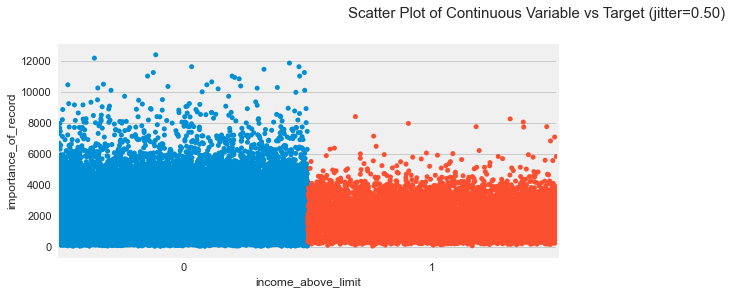

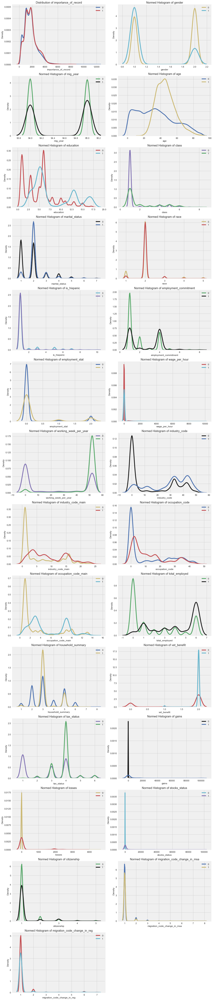

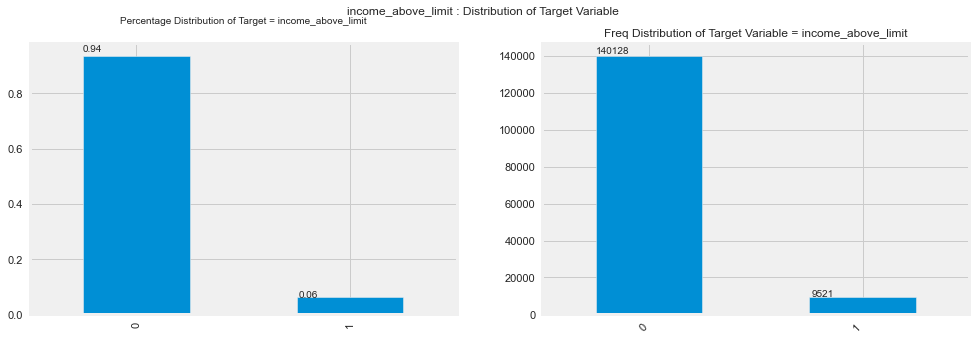

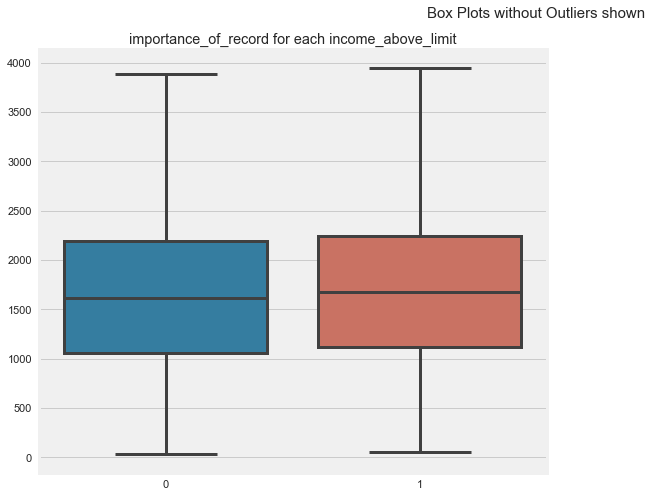

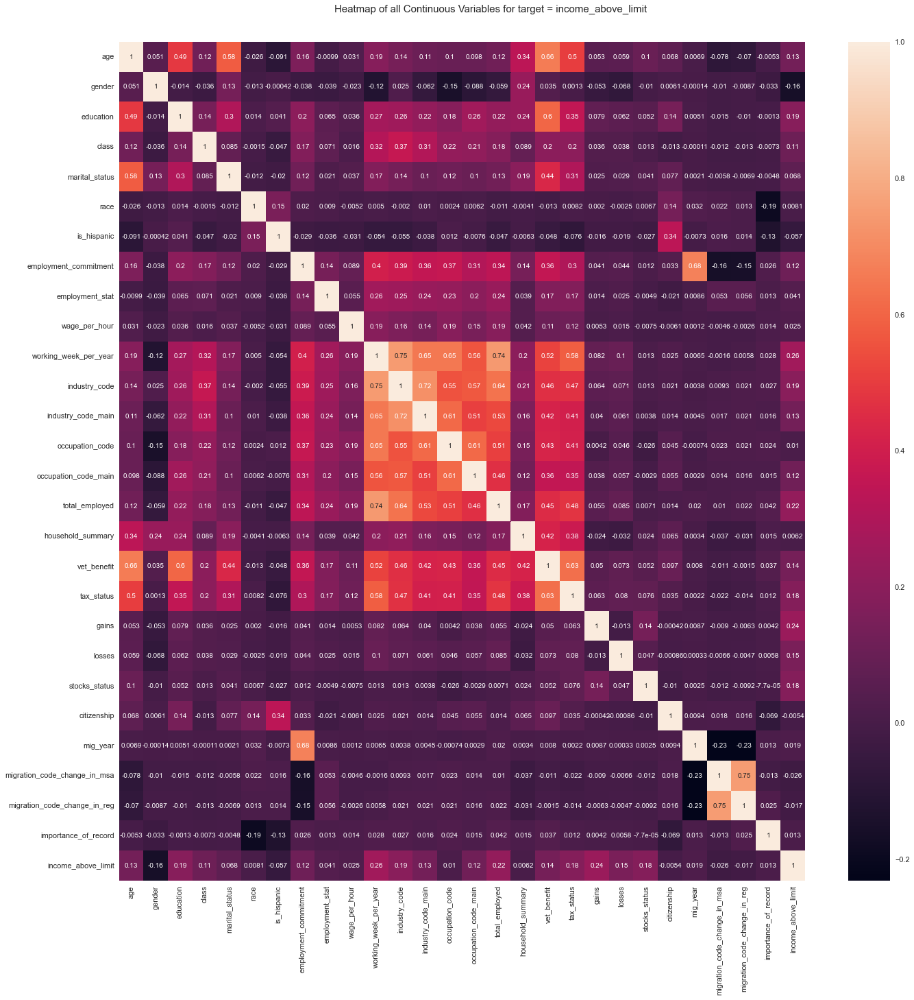

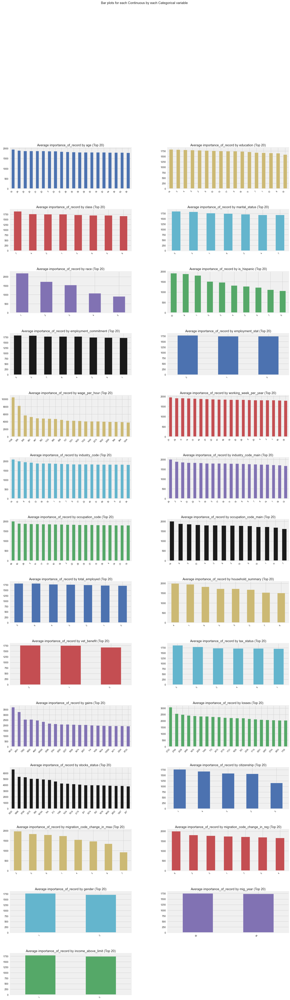

Time to run AutoViz (in seconds) = 167

 ###################### VISUALIZATION Completed ########################


In [136]:
df = av.AutoViz('',depVar = 'income_above_limit', dfte = df)

In [351]:
All are below income limit attributes: 
1. stock_status < 40000
2. Occupation is private household services
3. Children or Secondary individual living in group quarters
4. Getting veterans benefits
5. No losses and no gains
6. Migration code doesn't change
7. Working week per year is 52
8. Very high gains (100000) for those not born in US or migrants
9. Occupation is professional (code=4, code_main is 9) AND couples paying tax below 65 years (tax_status = 4)
10. Single tax payers (tax_status = 3)
11. industry_code is 3 or 5

SyntaxError: invalid syntax (3595143800.py, line 1)

In [130]:
duplicate_rows = df.duplicated()
duplicated_index = df[df.duplicated() == True].index
df = df.drop(index = duplicated_index)
df.duplicated().sum()

0

In [140]:
df.shape

(149649, 28)

((149649, 27), (149649,))

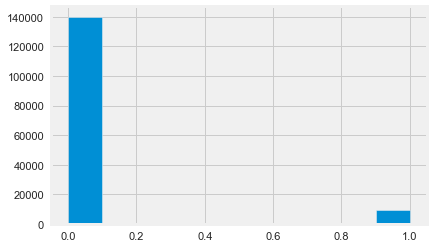

In [143]:
# Target variable balancing
plt.hist(df['income_above_limit'])
y = df['income_above_limit']
X = df.drop(columns = 'income_above_limit')
st = SMOTETomek(sampling_strategy = 'auto')
X.shape, y.shape

In [144]:
X_smt, y_smt = st.fit_resample(X,y)

(array([139490.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0., 139490.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

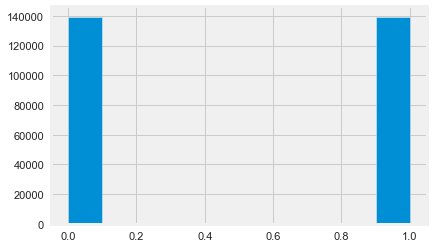

In [145]:
# Target class is balanced
plt.hist(y_smt)

In [146]:
# Model evaluation using catboost
# Using Pool data set drastically improves the performance
cb = CatBoostClassifier()

In [174]:
# cat_features need to be passed as a list of indices after the declaration
categorical_columns = df_copy.describe(include = ['O']).columns
X_smt[categorical_columns] = X_smt[categorical_columns].astype('category')
#X_smt[categorical_columns].describe(include = 'category').columns
cat_features_list = X_smt.columns.get_indexer(categorical_columns)
#[1,2,3,4,5,6,7,12,14,16,18,23,25,25]

In [175]:
X_train,X_test,y_train,y_test = train_test_split (X_smt,y_smt,test_size = 0.3,random_state = 42)

In [176]:
# By default the no. of iterations is 1000, model has overfitted if resulting iterations > fitted values (which is 1000 here)
cb.fit(X_train,y_train, cat_features = cat_features_list)

Learning rate set to 0.09796
0:	learn: 0.5742584	total: 931ms	remaining: 15m 29s
1:	learn: 0.4901321	total: 1.75s	remaining: 14m 34s
2:	learn: 0.4329486	total: 2.43s	remaining: 13m 28s
3:	learn: 0.3906571	total: 3.06s	remaining: 12m 41s
4:	learn: 0.3607801	total: 3.51s	remaining: 11m 38s
5:	learn: 0.3241449	total: 4.15s	remaining: 11m 27s
6:	learn: 0.3076578	total: 4.77s	remaining: 11m 16s
7:	learn: 0.2815362	total: 5.44s	remaining: 11m 14s
8:	learn: 0.2661197	total: 6.14s	remaining: 11m 15s
9:	learn: 0.2565898	total: 6.84s	remaining: 11m 16s
10:	learn: 0.2409231	total: 7.42s	remaining: 11m 7s
11:	learn: 0.2342607	total: 8.08s	remaining: 11m 5s
12:	learn: 0.2293796	total: 8.7s	remaining: 11m
13:	learn: 0.2220026	total: 9.36s	remaining: 10m 59s
14:	learn: 0.2161228	total: 9.93s	remaining: 10m 51s
15:	learn: 0.2078980	total: 10.3s	remaining: 10m 35s
16:	learn: 0.2029548	total: 11s	remaining: 10m 33s
17:	learn: 0.1958040	total: 11.7s	remaining: 10m 38s
18:	learn: 0.1906732	total: 12.4s	re

In [ ]:
# AVOID Hypertuning takes a lot of time to increase the training speed (Increasing learning rate when iterations reduce), border_count ideal value = 254 if running on CPU
# cb.fit(X_train,y_train, cat_features = cat_features_list)
grid = {'iterations': [900,950], 'learning_rate': [0.078,0.077], 'boosting_type': ['Ordered','Plain']}
grid_cb = GridSearchCV(estimator = cb, param_grid = grid, scoring = 'accuracy')
grid_cb.fit(X_train, y_train, cat_features = cat_features_list)

0:	learn: 0.6321865	total: 486ms	remaining: 7m 16s
1:	learn: 0.5860437	total: 1.01s	remaining: 7m 33s
2:	learn: 0.5490119	total: 1.52s	remaining: 7m 35s
3:	learn: 0.5186060	total: 1.96s	remaining: 7m 19s
4:	learn: 0.4954406	total: 2.42s	remaining: 7m 12s
5:	learn: 0.4661581	total: 2.86s	remaining: 7m 6s
6:	learn: 0.4442709	total: 3.32s	remaining: 7m 3s
7:	learn: 0.4253850	total: 3.8s	remaining: 7m 3s
8:	learn: 0.4104706	total: 4.28s	remaining: 7m 3s
9:	learn: 0.4006789	total: 4.81s	remaining: 7m 7s
10:	learn: 0.3900736	total: 5.26s	remaining: 7m 5s
11:	learn: 0.3813431	total: 5.77s	remaining: 7m 6s
12:	learn: 0.3738518	total: 6.27s	remaining: 7m 7s
13:	learn: 0.3667204	total: 6.72s	remaining: 7m 5s
14:	learn: 0.3611694	total: 7.25s	remaining: 7m 7s
15:	learn: 0.3559475	total: 7.72s	remaining: 7m 6s
16:	learn: 0.3488853	total: 8.23s	remaining: 7m 7s
17:	learn: 0.3428492	total: 8.74s	remaining: 7m 8s
18:	learn: 0.3391250	total: 9.27s	remaining: 7m 9s
19:	learn: 0.3358162	total: 9.81s	rem

In [177]:
y_pred = cb.predict(X_test)

In [178]:
print (skm.classification_report(y_test, y_pred, output_dict = True, target_names = ['Below income limit', 'Above income limit']))
print ('The accuracy before hyperparamter tuning is ',skm.accuracy_score(y_test, y_pred))

{'Below income limit': {'precision': 0.9586498089352267, 'recall': 0.9771585198720877, 'f1-score': 0.9678156813716735, 'support': 41591}, 'Above income limit': {'precision': 0.9769975786924939, 'recall': 0.9583640120656485, 'f1-score': 0.9675910938455451, 'support': 42103}, 'accuracy': 0.9677037780486056, 'macro avg': {'precision': 0.9678236938138602, 'recall': 0.9677612659688681, 'f1-score': 0.9677033876086093, 'support': 83694}, 'weighted avg': {'precision': 0.9678798152688971, 'recall': 0.9677037780486056, 'f1-score': 0.9677027006488906, 'support': 83694}}
The accuracy before hyperparamter tuning is  0.9677037780486056


In [179]:
# Untuned
cb.get_all_params()

{'nan_mode': 'Min',
 'eval_metric': 'Logloss',
 'combinations_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=MinEntropy:Prior=0/1:Prior=0.5/1:Prior=1/1',
  'Counter:CtrBorderCount=15:CtrBorderType=Uniform:Prior=0/1'],
 'iterations': 1000,
 'sampling_frequency': 'PerTree',
 'fold_permutation_block': 0,
 'leaf_estimation_method': 'Newton',
 'counter_calc_method': 'SkipTest',
 'grow_policy': 'SymmetricTree',
 'penalties_coefficient': 1,
 'boosting_type': 'Plain',
 'model_shrink_mode': 'Constant',
 'feature_border_type': 'GreedyLogSum',
 'ctr_leaf_count_limit': 18446744073709551615,
 'bayesian_matrix_reg': 0.10000000149011612,
 'one_hot_max_size': 2,
 'eval_fraction': 0,
 'force_unit_auto_pair_weights': False,
 'l2_leaf_reg': 3,
 'random_strength': 1,
 'rsm': 1,
 'boost_from_average': False,
 'max_ctr_complexity': 4,
 'model_size_reg': 0.5,
 'simple_ctr': ['Borders:CtrBorderCount=15:CtrBorderType=Uniform:TargetBorderCount=1:TargetBorderType=Min

In [187]:
imp_features = cb.get_feature_importance()
print(type(imp_features), '\n',imp_features)

<class 'numpy.ndarray'> 
 [ 3.96446115  3.11504761  2.32269467  1.11459956  3.68962984  0.35096809
  0.35099141  7.35710231  1.16349336  0.33263091  2.43516897 13.56420147
 10.62053934 13.4444099   9.42069596  1.68649321  1.68948346  0.94879103
  4.94165066  2.73998271  0.89633432  2.09749011  0.47868684  7.87625482
  0.63655878  1.21498003  1.54665948]


In [188]:
list_features = list(cb.get_feature_importance())

In [197]:
imp_features[imp_features>3]

array([ 3.96446115,  3.11504761,  3.68962984,  7.35710231, 13.56420147,
       10.62053934, 13.4444099 ,  9.42069596,  4.94165066,  7.87625482])

In [198]:
imp_features

array([ 3.96446115,  3.11504761,  2.32269467,  1.11459956,  3.68962984,
        0.35096809,  0.35099141,  7.35710231,  1.16349336,  0.33263091,
        2.43516897, 13.56420147, 10.62053934, 13.4444099 ,  9.42069596,
        1.68649321,  1.68948346,  0.94879103,  4.94165066,  2.73998271,
        0.89633432,  2.09749011,  0.47868684,  7.87625482,  0.63655878,
        1.21498003,  1.54665948])

In [201]:
X_train.columns

Index(['age', 'gender', 'education', 'class', 'marital_status', 'race',
       'is_hispanic', 'employment_commitment', 'employment_stat',
       'wage_per_hour', 'working_week_per_year', 'industry_code',
       'industry_code_main', 'occupation_code', 'occupation_code_main',
       'total_employed', 'household_summary', 'vet_benefit', 'tax_status',
       'gains', 'losses', 'stocks_status', 'citizenship', 'mig_year',
       'migration_code_change_in_msa', 'migration_code_change_in_reg',
       'importance_of_record'],
      dtype='object')

In [210]:
set(zip(X_train.columns,imp_features))

{('age', 3.96446114964913),
 ('citizenship', 0.47868684095287306),
 ('class', 1.1145995598801248),
 ('education', 2.322694673008643),
 ('employment_commitment', 7.357102308882779),
 ('employment_stat', 1.16349336280718),
 ('gains', 2.739982708342414),
 ('gender', 3.115047605087335),
 ('household_summary', 1.6894834611141292),
 ('importance_of_record', 1.5466594795232091),
 ('industry_code', 13.564201471850863),
 ('industry_code_main', 10.620539339680445),
 ('is_hispanic', 0.3509914077549102),
 ('losses', 0.8963343243520202),
 ('marital_status', 3.689629836439568),
 ('mig_year', 7.876254815905325),
 ('migration_code_change_in_msa', 0.6365587821215601),
 ('migration_code_change_in_reg', 1.2149800251127),
 ('occupation_code', 13.44440990489481),
 ('occupation_code_main', 9.42069595676742),
 ('race', 0.3509680880077975),
 ('stocks_status', 2.097490111805309),
 ('tax_status', 4.9416506621972465),
 ('total_employed', 1.6864932084836555),
 ('vet_benefit', 0.9487910291444303),
 ('wage_per_hour

In [216]:
X_new = X_smt[['age','employment_commitment','gender','industry_code_main','marital_status','mig_year','occupation_code_main','tax_status']]

In [219]:
X_new_train, X_new_test, y_new_train, y_new_test = train_test_split(X_new, y_smt, test_size = 0.3, random_state = 42)

In [237]:
X_new_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195286 entries, 215768 to 121958
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype   
---  ------                 --------------   -----   
 0   age                    195286 non-null  int64   
 1   employment_commitment  195286 non-null  category
 2   gender                 195286 non-null  category
 3   industry_code_main     195286 non-null  category
 4   marital_status         195286 non-null  category
 5   mig_year               195286 non-null  int64   
 6   occupation_code_main   195286 non-null  category
 7   tax_status             195286 non-null  category
dtypes: category(6), int64(2)
memory usage: 5.6 MB


In [225]:
cb.fit(X_new_train,y_new_train, cat_features = [1,2,3,4,6,7])

Learning rate set to 0.09796
0:	learn: 0.5604134	total: 388ms	remaining: 6m 27s
1:	learn: 0.4839956	total: 769ms	remaining: 6m 23s
2:	learn: 0.4373879	total: 1.1s	remaining: 6m 5s
3:	learn: 0.3893259	total: 1.42s	remaining: 5m 53s
4:	learn: 0.3583475	total: 1.68s	remaining: 5m 34s
5:	learn: 0.3380000	total: 1.96s	remaining: 5m 24s
6:	learn: 0.3246767	total: 2.19s	remaining: 5m 11s
7:	learn: 0.3138257	total: 2.45s	remaining: 5m 3s
8:	learn: 0.3053252	total: 2.73s	remaining: 5m 1s
9:	learn: 0.2919890	total: 3.02s	remaining: 4m 58s
10:	learn: 0.2828369	total: 3.25s	remaining: 4m 52s
11:	learn: 0.2747822	total: 3.49s	remaining: 4m 47s
12:	learn: 0.2685336	total: 3.75s	remaining: 4m 45s
13:	learn: 0.2632872	total: 4.08s	remaining: 4m 47s
14:	learn: 0.2600692	total: 4.46s	remaining: 4m 52s
15:	learn: 0.2562868	total: 4.72s	remaining: 4m 50s
16:	learn: 0.2531902	total: 4.97s	remaining: 4m 47s
17:	learn: 0.2466115	total: 5.28s	remaining: 4m 47s
18:	learn: 0.2448213	total: 5.64s	remaining: 4m 5

In [229]:
y_new_pred = cb.predict(X_new_test)
print (skm.classification_report(y_new_test, y_new_pred, output_dict = True, target_names = ['Below income limit', 'Above income limit']))
print ('The accuracy after extracting main features is ',skm.accuracy_score(y_test, y_pred))

{'Below income limit': {'precision': 0.9195842318222567, 'recall': 0.9125531966050348, 'f1-score': 0.9160552230160264, 'support': 41591}, 'Above income limit': {'precision': 0.9142641616180666, 'recall': 0.9211695128613163, 'f1-score': 0.9177038474279495, 'support': 42103}, 'accuracy': 0.9168877099911583, 'macro avg': {'precision': 0.9169241967201616, 'recall': 0.9168613547331755, 'f1-score': 0.916879535221988, 'support': 83694}, 'weighted avg': {'precision': 0.9169079238932889, 'recall': 0.9168877099911583, 'f1-score': 0.916884577971163, 'support': 83694}}
The accuracy after extracting main features is  0.9677037780486056


In [231]:
joblib.dump(cb,'catboost_model.joblib')

['catboost_model.joblib']

In [232]:
cb = joblib.load('catboost_model.joblib')

In [234]:
target_predictions = cb.predict(X_new_test)
target_predictions

array([0, 0, 1, ..., 1, 1, 0], dtype=int64)

In [280]:
arr1 = np.array(['hour','day_of_week','casualties','accident_cause','vehicles_involved', 
                            'vehicle_type','driver_age','accident_area','driving_experience','lanes'])
#data_test = .reshape(1,-1)
type(arr1.reshape(1,-1))
arr1.reshape(1,-1).shape
#print (arr1)

(1, 10)

In [304]:
# Example of encoding 
array1 = df_copy['gender'].unique()
array2 = X_new_train['gender'].unique()
gender_dict = {array2[i]:array1[i] for i in range(len(array1))}
print (gender_dict,'\n')

array1 = df_copy['employment_commitment'].unique()
array2 = X_new_train['employment_commitment'].unique()
emp_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (emp_dict,'\n')

array1 = df_copy['industry_code_main'].unique()
array2 = X_new_train['industry_code_main'].unique()
ind_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (ind_dict,'\n')

array1 = df_copy['marital_status'].unique()
array2 = X_new_train['marital_status'].unique()
mar_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (mar_dict,'\n')

array1 = df_copy['occupation_code_main'].unique()
array2 = X_new_train['occupation_code_main'].unique()
occ_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (occ_dict,'\n')

array1 = df_copy['tax_status'].unique()
array2 = X_new_train['tax_status'].unique()
tax_dict = {array2[i]:array1[i] for i in range(len(array2))}
print (tax_dict,'\n')

{2: ' Male', 1: ' Female'} 

{1: ' Children or Armed Forces', 4: ' Not in labor force', 2: ' PT for non-econ reasons usually FT', 3: ' Full-time schedules', 5: ' Unemployed full-time', 8: ' PT for econ reasons usually PT', 7: ' Unemployed part- time', 6: ' PT for econ reasons usually FT'} 

{6: ' Not in universe or children', 17: ' Business and repair services', 1: ' Finance insurance and real estate', 8: ' Manufacturing-durable goods', 3: ' Wholesale trade', 19: ' Hospital services', 4: ' Manufacturing-nondurable goods', 13: ' Public administration', 15: ' Medical except hospital', 10: ' Agriculture', 16: ' Construction', 12: ' Social services', 22: ' Personal services except private HH', 5: ' Education', 14: ' Other professional services', 20: ' Retail trade', 7: ' Communications', 21: ' Private household services', 9: ' Transportation', 11: ' Forestry and fisheries', 18: ' Entertainment', 2: ' Mining', 23: ' Utilities and sanitary services', 24: ' Armed Forces'} 

{2: ' Never marrie